In [1]:
import os
os.environ["CUDA_VISIBLE_DEVICES"]="1" # specify visible gpu(s) 0-3

In [2]:
import tensorflow as tf

try:
    tf_gpus = tf.config.list_physical_devices('GPU')
    for gpu in tf_gpus:
        tf.config.experimental.set_memory_growth(gpu, True) # allow memory growth on visible gpu(s)
except:
    pass

In [3]:
import matplotlib.pyplot as plt

import numpy as np
import pandas as pd
import glob
import skimage.io as io
from skimage import img_as_ubyte
import tifffile
from tqdm import tqdm
from datetime import datetime
from matplotlib import pyplot as plt
date = datetime.today().strftime('%Y-%m-%d')

from deepcell.applications import Mesmer
from deepcell.utils.plot_utils import create_rgb_image, make_outline_overlay

In [4]:
# paths
base_path = "~/CRS/ROI_exports/**/*.tiff"
tile_paths = glob.glob(base_path, recursive = True)


In [8]:
tile_paths

['~/CRS/ROI_exports/TMA24/TMA24001.tiff',
 '~/CRS/ROI_exports/TMA24/TMA24002.tiff',
 '~/CRS/ROI_exports/TMA24/TMA24003.tiff',
 '~/CRS/ROI_exports/TMA24/TMA24004.tiff',
 '~/CRS/ROI_exports/TMA24/TMA24005.tiff',
 '~/CRS/ROI_exports/TMA24/TMA24006.tiff',
 '~/CRS/ROI_exports/TMA24/TMA24007.tiff',
 '~/CRS/ROI_exports/TMA24/TMA24008.tiff',
 '~/CRS/ROI_exports/TMA24/TMA24009.tiff',
 '~/CRS/ROI_exports/TMA24/TMA24010.tiff',
 '~/CRS/ROI_exports/TMA24/TMA24011.tiff',
 '~/CRS/ROI_exports/TMA24/TMA24012.tiff',
 '~/CRS/ROI_exports/TMA24/TMA24013.tiff',
 '~/CRS/ROI_exports/TMA24/TMA24014.tiff',
 '~/CRS/ROI_exports/TMA24/TMA24015.tiff',
 '~/CRS/ROI_exports/TMA24/TMA24016.tiff',
 '~/CRS/ROI_exports/TMA24/TMA24017.tiff',
 '~/CRS/ROI_exports/TMA24/TMA24018.tiff',
 '~/CRS/ROI_exports/TMA24/TMA24019.tiff',
 '~/CRS/ROI_exports/TMA24/TMA24020.tiff',
 '~/CRS/ROI_exports/TMA24/TMA24021.tiff',
 '~/CRS/ROI_exports/TMA24/TMA24022.tiff',
 '~/CRS/ROI_exports/TMA24/TMA24023.tiff',
 '~/CRS/ROI_exports/TMA24/TMA24024

## Check TIFF Dimensions

Text(0.5, 1.0, 'PanCK')

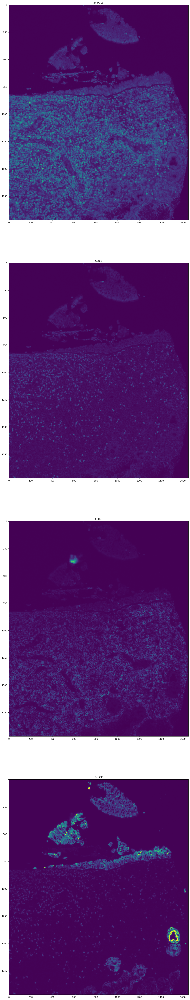

In [28]:
example_tiff = tifffile.imread(tile_paths[10])

# print(os.path.join(base_path, tile_paths[10]))
# print(example_tiff.shape)

img_height = example_tiff.shape[1]

img_width = example_tiff.shape[2]

fig, ax = plt.subplots(4,1, figsize = (80,80))

ax[0].imshow(example_tiff[0,:,:])
ax[1].imshow(example_tiff[1,:,:])
ax[2].imshow(example_tiff[2,:,:])
ax[3].imshow(example_tiff[3,:,:])

ax[0].set_title('SYTO13')
ax[1].set_title('CD68')
ax[2].set_title('CD45')
ax[3].set_title('PanCK')

## Example segmentation

In [29]:
# initialize empty nuclear and membrane arrays
nuclear_array = np.zeros((img_height, img_width))
membrane_array = np.zeros((img_height, img_width))

Text(0.5, 1.0, 'Membrane')

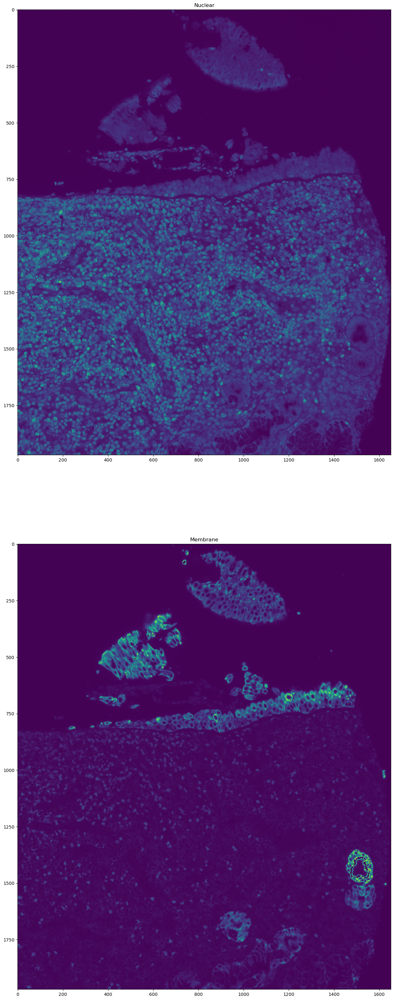

In [30]:
# nuclear markers
nuclear_array = np.add(nuclear_array, example_tiff[0,...])

membrane_array = np.add(membrane_array, example_tiff[1,...] + example_tiff[2,...] + example_tiff[3,...])

# QC

fig, ax = plt.subplots(2,1, figsize = (40, 40))

ax[0].imshow(nuclear_array)
ax[1].imshow(membrane_array)



ax[0].set_title('Nuclear')
ax[1].set_title('Membrane')


In [31]:
# stack nuclear and membrane together
stack = np.stack((nuclear_array, membrane_array), axis = -1)
stack = np.expand_dims(stack, 0) # expand to 4D

In [32]:
MPP = 560/1403

mesmer = Mesmer()

# maxima_threshold controls what is considered a unique cell (lower values = more separate cells, higher values = fewer cells)
    # interior_threshold determines what is considered background/not part of a cell (lower value = larger cells)
    # default_kwargs_cell = {
    #             'maxima_threshold': 0.075,
    #             'maxima_smooth': 0,
    #             'interior_threshold': 0.2,
    #             'interior_smooth': 2,
    #             'small_objects_threshold': 15,
    #             'fill_holes_threshold': 15,
    #             'radius': 2
    #         }

predictions = mesmer.predict(stack, image_mpp = MPP,
                                postprocess_kwargs_whole_cell={"maxima_threshold" : 0.05,
                                                             "interior_threshold" : 0.01})

rgb_image = create_rgb_image(stack, channel_colors = ["green", "blue"])
overlay = make_outline_overlay(rgb_data = rgb_image, predictions = predictions)



Text(0.5, 1.0, 'Prediction')

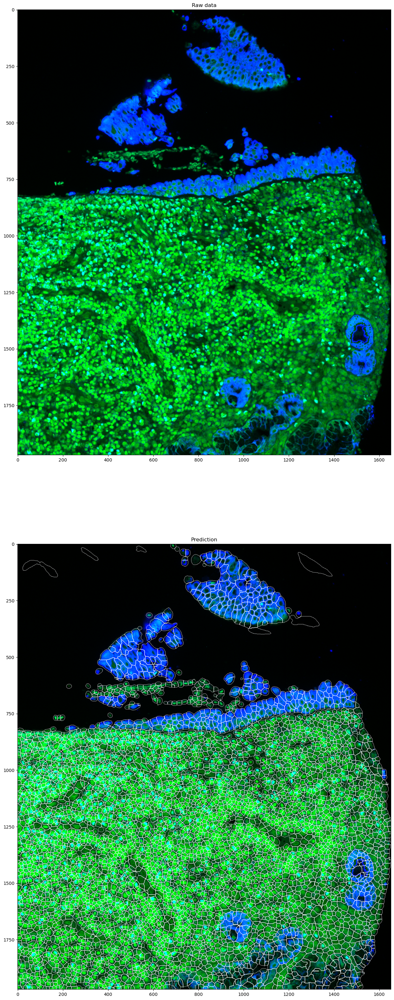

In [33]:
fig, ax = plt.subplots(2,1, figsize = (40, 40))

ax[0].imshow(rgb_image[0, ...])
ax[1].imshow(overlay[0, ...])

ax[0].set_title('Raw data')
ax[1].set_title('Prediction')

In [34]:
tile_paths

['~/CRS/ROI_exports/TMA24/TMA24001.tiff',
 '~/CRS/ROI_exports/TMA24/TMA24002.tiff',
 '~/CRS/ROI_exports/TMA24/TMA24003.tiff',
 '~/CRS/ROI_exports/TMA24/TMA24004.tiff',
 '~/CRS/ROI_exports/TMA24/TMA24005.tiff',
 '~/CRS/ROI_exports/TMA24/TMA24006.tiff',
 '~/CRS/ROI_exports/TMA24/TMA24007.tiff',
 '~/CRS/ROI_exports/TMA24/TMA24008.tiff',
 '~/CRS/ROI_exports/TMA24/TMA24009.tiff',
 '~/CRS/ROI_exports/TMA24/TMA24010.tiff',
 '~/CRS/ROI_exports/TMA24/TMA24011.tiff',
 '~/CRS/ROI_exports/TMA24/TMA24012.tiff',
 '~/CRS/ROI_exports/TMA24/TMA24013.tiff',
 '~/CRS/ROI_exports/TMA24/TMA24014.tiff',
 '~/CRS/ROI_exports/TMA24/TMA24015.tiff',
 '~/CRS/ROI_exports/TMA24/TMA24016.tiff',
 '~/CRS/ROI_exports/TMA24/TMA24017.tiff',
 '~/CRS/ROI_exports/TMA24/TMA24018.tiff',
 '~/CRS/ROI_exports/TMA24/TMA24019.tiff',
 '~/CRS/ROI_exports/TMA24/TMA24020.tiff',
 '~/CRS/ROI_exports/TMA24/TMA24021.tiff',
 '~/CRS/ROI_exports/TMA24/TMA24022.tiff',
 '~/CRS/ROI_exports/TMA24/TMA24023.tiff',
 '~/CRS/ROI_exports/TMA24/TMA24024

In [35]:
for tile_path in tile_paths:
    print("Working on ", tile_path)
    # pull example tiff for image dimensions
    ROI_num = tile_path.split('/')[-1].split('.tiff')[0]
    ROI_path = os.path.join(base_path, tile_path)
    ROI_img = tifffile.imread(os.path.join(base_path, tile_path))
    img_height = ROI_img.shape[1]
    img_width = ROI_img.shape[2]
    
    # initialize empty nuclear and membrane arrays
    nuclear_array = membrane_array = np.zeros((img_height, img_width))
    
    nuclear_array = np.add(nuclear_array, ROI_img[0,...])

    membrane_array = np.add(membrane_array, ROI_img[1,...] + ROI_img[2,...] + ROI_img[3,...])
    
    # stack nuclear and membrane together
    stack = np.stack((nuclear_array, membrane_array), axis = -1)
    stack = np.expand_dims(stack, 0) # expand to 4D
    
    # run MESMER
    mesmer = Mesmer()
    
    # mpp = microns per pixel, depending on what resolution tissue was scanned at (400 microns / 512 pixels = 0.78)
    # maxima_threshold controls what is considered a unique cell (lower values = more separate cells, higher values = fewer cells)
    # interior_threshold determines what is considered background/not part of a cell (lower value = larger cells)
    # default_kwargs_cell = {
    #             'maxima_threshold': 0.075,
    #             'maxima_smooth': 0,
    #             'interior_threshold': 0.2,
    #             'interior_smooth': 2,
    #             'small_objects_threshold': 15,
    #             'fill_holes_threshold': 15,
    #             'radius': 2
    #         }

    predictions = mesmer.predict(stack, image_mpp = MPP,
                                postprocess_kwargs_whole_cell={"maxima_threshold" : 0.05,
                                                             "interior_threshold" : 0.01})
    
    rgb_image = create_rgb_image(stack, channel_colors = ["green", "blue"])
    overlay = make_outline_overlay(rgb_data = rgb_image, predictions = predictions)
    
    # save all MESMER outputs
    output_dir = f"~/CRS/seg_0.05interior_0.01maxima_{date}/" + ROI_num + "/"
    if os.path.exists(output_dir) == False:
        os.makedirs(output_dir)
    
    io.imsave(output_dir + "nuclear.tiff", nuclear_array, check_contrast = False) # nuclear array 
    io.imsave(output_dir + "membrane.tiff", membrane_array, check_contrast = False) # membrane array
    io.imsave(output_dir + "seg_outline.tiff", overlay[0, ..., 0], check_contrast = False) # segmentation outline
    io.imsave(output_dir + "seg_overlay.tiff", overlay[0, ...], check_contrast = False) # segmentation overlay (nuc + membrane + outline)
    io.imsave(output_dir + "MESMER_mask.tiff", predictions[0, ..., 0], check_contrast = False) # MESMER mask
    io.imsave(output_dir + "SYTO13.tiff", ROI_img[0,...], check_contrast = False)
    io.imsave(output_dir + "CD68.tiff", ROI_img[1,...], check_contrast = False)
    io.imsave(output_dir + "CD45.tiff", ROI_img[2,...], check_contrast = False)
    io.imsave(output_dir + "PanCK.tiff", ROI_img[3,...], check_contrast = False)

Working on  ~/CRS/ROI_exports/TMA24/TMA24001.tiff


/opt/miniconda3/envs/cellSeg/lib/python3.9/site-packages/deepcell_toolbox/deep_watershed.py:179: FutureWarning: `selem` is a deprecated argument name for `h_maxima`. It will be removed in version 1.0. Please use `footprint` instead.
  markers = h_maxima(image=maxima,


Working on  ~/CRS/ROI_exports/TMA24/TMA24002.tiff
Working on  ~/CRS/ROI_exports/TMA24/TMA24003.tiff
Working on  ~/CRS/ROI_exports/TMA24/TMA24004.tiff
Working on  ~/CRS/ROI_exports/TMA24/TMA24005.tiff
Working on  ~/CRS/ROI_exports/TMA24/TMA24006.tiff
Working on  ~/CRS/ROI_exports/TMA24/TMA24007.tiff
Working on  ~/CRS/ROI_exports/TMA24/TMA24008.tiff
Working on  ~/CRS/ROI_exports/TMA24/TMA24009.tiff
Working on  ~/CRS/ROI_exports/TMA24/TMA24010.tiff
Working on  ~/CRS/ROI_exports/TMA24/TMA24011.tiff
Working on  ~/CRS/ROI_exports/TMA24/TMA24012.tiff
Working on  ~/CRS/ROI_exports/TMA24/TMA24013.tiff
Working on  ~/CRS/ROI_exports/TMA24/TMA24014.tiff
Working on  ~/CRS/ROI_exports/TMA24/TMA24015.tiff
Working on  ~/CRS/ROI_exports/TMA24/TMA24016.tiff
Working on  ~/CRS/ROI_exports/TMA24/TMA24017.tiff
Working on  ~/CRS/ROI_exports/TMA24/TMA24018.tiff
Working on  ~/CRS/ROI_exports/TMA24/TMA24019.tiff
Working on  ~/CRS/ROI_exports/TMA24/TMA24020.tiff
Working on  ~/CRS/ROI_exports/TMA24/TMA24021.tiff


### Extract Single Cell Info

In [36]:
import PIL
from PIL import Image, ImageSequence, ImageOps
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import skimage 
import skimage.io
import skimage.measure
import skimage.morphology
import glob
from scipy.io import loadmat
import time
from tqdm import tqdm
import os

clusterChannels = ['SYTO13', 'CD68', 'CD45', 'PanCK']
counter = 0
for run_path in glob.glob(base_path, recursive = True):
    counter += 1
    run = run_path.split('/')[-1].split('.tiff')[0]
    
    print(f"Working on: ROI {counter}    ", run)
    # read in all tiff files
    img_tiff_path = run_path

    array_list=[]
    ROI_img = tifffile.imread(img_tiff_path)
    channelNum = ROI_img.shape[0]
    for i in range(channelNum):
        t=ROI_img[i,...]
        array_list.append(t)
    
    countsNoNoise=np.stack(array_list, axis=2) # count matrices in the image
    
    # load mask
    segMat = skimage.io.imread("~/CRS/seg_0.05interior_0.01maxima_2023-10-11/" + run + "/MESMER_mask.tiff")
    stats = skimage.measure.regionprops(segMat)
    labelNum = len(stats) # number of actual cells not always equal to np.max(segMat)
    
    # init empty containers
    data = np.zeros((labelNum,channelNum))
    dataScaleSize = np.zeros((labelNum,channelNum))
    cellSizes = np.zeros((labelNum,1))
    cell_props = np.zeros((labelNum, 3))
    
    # extract info
    for i in range(labelNum): # for each cell (label)
        cellLabel = stats[i].label
        label_counts=[countsNoNoise[coord[0],coord[1],:] for coord in stats[i].coords] # all channel count for this cell
        data[i, 0:channelNum] = np.sum(label_counts, axis=0) #  sum the counts for this cell
        dataScaleSize[i,0:channelNum] = np.sum(label_counts, axis=0) / stats[i].area # scaled by size
        cellSizes[i] = stats[i].area # cell sizes
        cell_props[i, 0] = cellLabel
        cell_props[i, 1] = stats[i].centroid[0] # Y_cent
        cell_props[i, 2] = stats[i].centroid[1] # X_cent
    
    data_df = pd.DataFrame(data)
    data_df.columns = clusterChannels
    data_full = pd.concat((pd.DataFrame(cell_props, columns = ["cellLabel", "Y_cent", "X_cent"]), pd.DataFrame(cellSizes, columns = ["cellSize"]), data_df), axis=1)

    dataScaleSize_df = pd.DataFrame(dataScaleSize)
    dataScaleSize_df.columns = clusterChannels
    dataScaleSize_full = pd.concat((pd.DataFrame(cell_props, columns = ["cellLabel", "Y_cent", "X_cent"]), pd.DataFrame(cellSizes, columns = ["cellSize"]), dataScaleSize_df), axis = 1)
    
    # save all dfs
    save_dir = os.path.join("~/CRS/extracted_info/" + run + "/")
    
    if os.path.exists(save_dir) == False:
        os.makedirs(save_dir)

    data_full.to_csv(save_dir + "data.csv", index = False)
    dataScaleSize_full.to_csv(save_dir + "dataScaleSize.csv", index = False)

Working on: ROI 1     TMA24001
Working on: ROI 2     TMA24002
Working on: ROI 3     TMA24003
Working on: ROI 4     TMA24004
Working on: ROI 5     TMA24005
Working on: ROI 6     TMA24006
Working on: ROI 7     TMA24007
Working on: ROI 8     TMA24008
Working on: ROI 9     TMA24009
Working on: ROI 10     TMA24010
Working on: ROI 11     TMA24011
Working on: ROI 12     TMA24012
Working on: ROI 13     TMA24013
Working on: ROI 14     TMA24014
Working on: ROI 15     TMA24015
Working on: ROI 16     TMA24016
Working on: ROI 17     TMA24017
Working on: ROI 18     TMA24018
Working on: ROI 19     TMA24019
Working on: ROI 20     TMA24020
Working on: ROI 21     TMA24021
Working on: ROI 22     TMA24022
Working on: ROI 23     TMA24023
Working on: ROI 24     TMA24024
Working on: ROI 25     TMA24025
Working on: ROI 26     TMA24026
Working on: ROI 27     TMA24027
Working on: ROI 28     TMA24028
Working on: ROI 29     TMA24029
Working on: ROI 30     TMA24030
Working on: ROI 31     TMA24031
Working on: ROI 3